In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
def rotate_init_box(bb, cx, cy, theta):
    new_bb = list(bb)
    for i,coord in enumerate(bb):
        # opencv calculates standard transformation matrix
        M = cv2.getRotationMatrix2D((cx, cy), theta, 1.0)
        # Grab  the rotation components of the matrix)
        # Prepare the vector to be transformed
        v = [coord[0],coord[1],1]
        # Perform the actual rotation and return the image
        calculated = np.dot(M,v)
        new_bb[i] = (calculated[0],calculated[1])
    return new_bb

def convert_bbox_to_rbox(cx, cy, h, w, theta):
    x1, y1, x3, y3 = cx-(w/2), cy-(h/2), cx+(w/2), cy+(h/2)
    x4, y4, x2, y2 = cx-(w/2), cy+(h/2), cx+(w/2), cy-(h/2)
    bbox = [(x1, y1), (x2, y2), (x3, y3), (x4, y4)]
   
    rbox = rotate_init_box(bbox, cx, cy, -theta)
    return rbox


In [0]:
def rotate_box(bb, cx, cy, h, w, theta):
    new_bb = list(bb)
    for i,coord in enumerate(bb):
        # opencv calculates standard transformation matrix
        M = cv2.getRotationMatrix2D((cx, cy), theta, 1.0)
        # Prepare the vector to be transformed
        v = [coord[0],coord[1],1]
        # Perform the actual rotation and return the image
        calculated = np.dot(M,v)
        new_bb[i] = (calculated[0],calculated[1])
    return new_bb

In [0]:
def rotate_bound(image, angle):
    # grab the dimensions of the image and then determine the
    # centre
    (h, w) = image.shape[:2]
    (cX, cY) = (w // 2, h // 2)

    # grab the rotation matrix (applying the negative of the
    # angle to rotate clockwise), then grab the sine and cosine
    # (i.e., the rotation components of the matrix)
    M = cv2.getRotationMatrix2D((cX, cY), angle, 1.0)
    cos = np.abs(M[0, 0])
    sin = np.abs(M[0, 1])

    # compute the new bounding dimensions of the image
    nW = int((h * sin) + (w * cos))
    nH = int((h * cos) + (w * sin))

    # adjust the rotation matrix to take into account translation
    #M[0, 2] += (nW / 2) - cX
    #M[1, 2] += (nH / 2) - cY

    # perform the actual rotation and return the image
    return cv2.warpAffine(image, M, (nW, nH))

In [0]:
def diff_baseline_image(points, base):
    points = np.array(points)
    padding = 10
    #print("smallest: ", points[points < 0])
    #print("biggest: ", points[base < points])

    if (not len(points[base < points]) == 0) and (not len(points[points < 0]) == 0):
        print("What??? small image")
        return 0
    diff=0
    over = points[base < points]
    if not 0 == len(over):
        diff = max(over) - base + padding

    over = points[points < 0]
    if not 0 == len(over):
        diff = min(over) - padding
    return -diff      

In [64]:
import io
import numpy as np
import cv2
import tensorflow as tf
from PIL import Image
from google.colab.patches import cv2_imshow
import math

# feature를 묘사하는 dictionary를 생성합니다.
image_feature_description = {
    'image/encoded': tf.FixedLenFeature((), tf.string, default_value=''),
    'image/format': tf.FixedLenFeature((), tf.string, default_value='png'),
    'image/filename': tf.FixedLenFeature((), tf.string, default_value=''),
    'image/height': tf.FixedLenFeature((), tf.int64, 1),
    'image/width': tf.FixedLenFeature((), tf.int64, 1),
                
    # Object rotated boxes.
    'image/object/rbbox/cy': tf.VarLenFeature(tf.float32),
    'image/object/rbbox/cx': tf.VarLenFeature(tf.float32),
    'image/object/rbbox/h': tf.VarLenFeature(tf.float32),
    'image/object/rbbox/w': tf.VarLenFeature(tf.float32),
    'image/object/rbbox/ang': tf.VarLenFeature(tf.float32),

    # Object classes.
    'image/object/class/label': tf.VarLenFeature(tf.int64),
    #'image/object/class/text': tf.FixedLenFeature((), tf.string, default_value=''),
}

def _parse_image_function(example_proto):
  # tf.Example을 parsing합니다.
  return tf.parse_single_example(example_proto, image_feature_description)

filename = "/content/gdrive/My Drive/findShip/tfrecords/test_40p_w_neg_img_only_pos.tfrecords"
# tf.data.TFRecordDataset을 생성합니다.
raw_image_dataset = tf.data.TFRecordDataset(filename)
parsed_image_dataset = raw_image_dataset.map(_parse_image_function)
print(parsed_image_dataset)

# tf.data.TFRecordDataset을 iterator로 돌면서 이미지를 화면에 출력합니다.
iterator = parsed_image_dataset.make_one_shot_iterator()
next_element = iterator.get_next()


# InteractiveSession을 엽니다.
sess = tf.InteractiveSession()


<DatasetV1Adapter shapes: {image/object/class/label: (?,), image/object/rbbox/ang: (?,), image/object/rbbox/cx: (?,), image/object/rbbox/cy: (?,), image/object/rbbox/h: (?,), image/object/rbbox/w: (?,), image/encoded: (), image/filename: (), image/format: (), image/height: (), image/width: ()}, types: {image/object/class/label: tf.int64, image/object/rbbox/ang: tf.float32, image/object/rbbox/cx: tf.float32, image/object/rbbox/cy: tf.float32, image/object/rbbox/h: tf.float32, image/object/rbbox/w: tf.float32, image/encoded: tf.string, image/filename: tf.string, image/format: tf.string, image/height: tf.int64, image/width: tf.int64}>


/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/client/session.py:1750: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


In [0]:
def move_inside_rbbox(image, rbbox):
    # 이미지 회전 후 bbox가 이미지 사이즈보다 더 커지는 경우 방지
    # bbox가 이미지 사이즈 보다 크거나 작을 경우 사이즈를 옮긴다
    xs = [box[0] for box in rbbox]
    ys = [box[1] for box in rbbox]

    x_diff = diff_baseline_image(xs, image.shape[0])
    y_diff = diff_baseline_image(ys, image.shape[1])

    # 변환 행렬, X축으로 10, Y축으로 20 이동
    M = np.float32([[1,0,x_diff],[0,1,y_diff]])
    (heigth, width) = image.shape[:2]
    rimage = cv2.warpAffine(image, M,(width, heigth))

    rbbox = [[x+x_diff, y+y_diff] for x, y in zip(xs, ys)]
    return rimage, rbbox


In [0]:
def get_label(idx):
    minX, minY = rbboxs[idx]['rbbox']['minX'], rbboxs[idx]['rbbox']['minY']
    maxX, maxY = rbboxs[idx]['rbbox']['maxX'], rbboxs[idx]['rbbox']['maxY']
    label = rbboxs[idx]['rbbox']['label']

    return minX, minY, maxX, maxY, label

def get_image(idx):
    x_diff, y_diff = rbboxs[idx]['image_param']['x_diff'], rbboxs[idx]['image_param']['y_diff']
    theta, fileidx = rbboxs[idx]['image_param']['theta'], rbboxs[idx]['image_param']['fileidx']
    image = np.array(Image.open(images[fileidx]))
    # 이미지 돌리기
    image = rotate_bound(image, theta)
    # 이미지 이동
    (heigth, width) = 768, 768 #image.shape[:2]
    print(heigth, width)
    M = np.float32([[1,0,x_diff],[0,1,y_diff]])
    image = cv2.warpAffine(image, M, (width, heigth))

    return image


In [75]:
idx = 3506
for i in range(idx):
    minX, minY, maxX, maxY, label = get_label(i)
    print(i)    
    if maxX <= minX:
        raise ValueError("sdfsdsdfsd")
    if maxY <= minY:
        raise ValueError("sdfsdsdfsd1222222")

    for x in [minX, minY, maxX, maxY]:
        if x <= 0:
            raise ValueError("x <= 0")
        if 768 <= x:
            raise ValueError("768 <= x")        

0
1
2
3
4
5


ValueError: ignored

{'image_param': {'fileidx': 2,
                 'theta': -50.36562710947185,
                 'x_diff': 0,
                 'y_diff': 0},
 'rbbox': {'label': 4,
           'maxX': 861.7495375289262,
           'maxY': 437.79556711438664,
           'minX': 164.17617327111384,
           'minY': 228.04114206555863}}
768 768


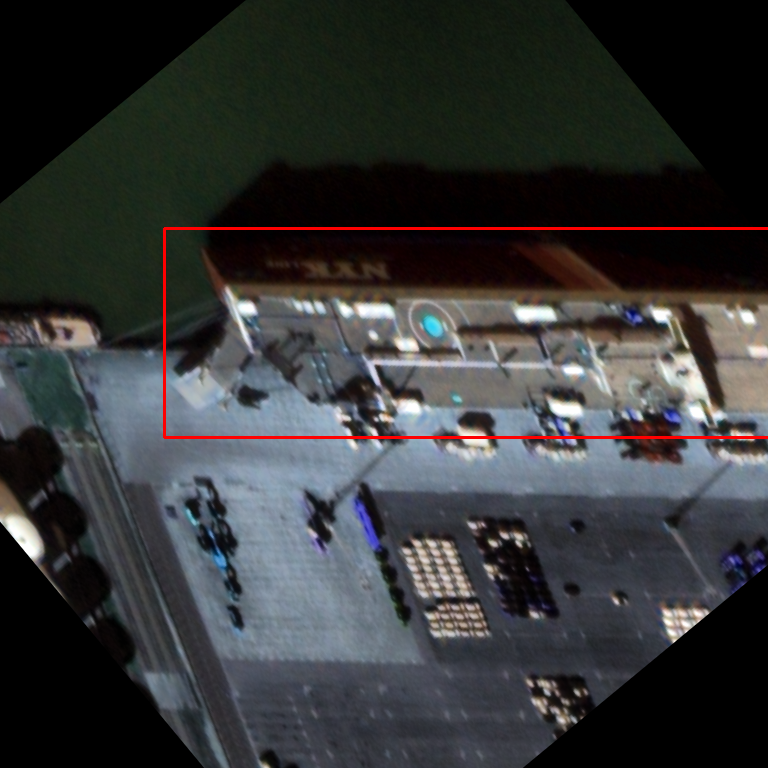

In [77]:
idx=5
l = get_label(idx)
pprint(rbboxs[idx])

img = get_image(idx)

cv2.rectangle(img, (int(l[0]), int(l[1])), (int(l[2]), int(l[3])), (0, 0, 255), 2 )
cv2_imshow(img)

In [69]:
len(rbboxs)

3507

In [55]:
image = cv2.imread(encoded_jpg_io)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

SystemError: ignored

In [68]:
from pprint import pprint

rbboxs = []
images = []

image_idx=0
try:
    while True:
        #if 10 == image_idx: break
        image_features = sess.run(next_element)

        cxv = image_features['image/object/rbbox/cx'].values
        cyv = image_features['image/object/rbbox/cy'].values
        hv = image_features['image/object/rbbox/h'].values
        wv = image_features['image/object/rbbox/w'].values
        thetav = image_features['image/object/rbbox/ang'].values
        answers = image_features['image/object/class/label'].values
        encoded_jpg_io = io.BytesIO(image_features['image/encoded'])

        try:
            images[image_idx]
        except IndexError:
            images.append(encoded_jpg_io)
        
        oimage = np.array(Image.open(encoded_jpg_io))
        for cx, cy, h, w, theta, answer in zip(cxv, cyv, hv, wv, thetav, answers):
            image = oimage.copy()
            (heigth, width) = image.shape[:2]
            (imgcX, imgcY) = (width // 2, heigth // 2)
            theta= math.degrees(theta)

            #print(image_features['image/filename'], image.shape) 
            rbox = convert_bbox_to_rbox(cx, cy, h, w, theta)

            rbbox = rotate_box(rbox, imgcX, imgcY, heigth, width, theta)
            image = rotate_bound(image, theta)

            # 이미지 회전 후 bbox가 이미지 사이즈보다 더 커지는 경우 방지
            # bbox가 이미지 사이즈 보다 크거나 작을 경우 사이즈를 옮긴다
            xs = [box[0] for box in rbbox]
            ys = [box[1] for box in rbbox]

            x_diff = diff_baseline_image(xs, image.shape[0])
            y_diff = diff_baseline_image(ys, image.shape[1])

            rbbox = [[x+x_diff, y+y_diff] for x, y in zip(xs, ys)]

            xy = pd.DataFrame(data=rbbox, columns=['x','y'])
            xy1 = xy.nsmallest(2, 'x').nsmallest(1, 'y').values[0].tolist()    
            xy2 = xy.nlargest(2, 'y').nlargest(1, 'x').values[0].tolist()  

            """
            print("rbbox: ", rbbox)
            print("rimage shape: ", image.shape)
            """
            #print("xy, xy", xy1, xy2)
            #print("image index:", image_idx)
            
            rbboxs.append(
                {"image_param": {'x_diff': x_diff, 'y_diff': y_diff,
                               'theta': theta, 'fileidx': image_idx},
                "rbbox": {'minX': xy1[0], 'minY': xy1[1],
                          'maxX': xy2[0], 'maxY': xy2[1],
                          'label': label}
                })

        image_idx+=1
except tf.errors.OutOfRangeError:
    pass


What??? small image


b'100.png' (768, 768, 3)
smallest:  []
biggest:  []
smallest:  []
biggest:  []
x_diff, y_diff 0 0
rbbox:  [[309.3537093200384, 315.29532111835323], [420.00654135128843, 315.29532111835323], [420.0065413512884, 348.42559302997427], [309.3537093200383, 348.4255930299743]]
rimage shape:  (768, 768, 3)
rbbox:  [[309.3537093200384, 315.29532111835323], [420.00654135128843, 315.29532111835323], [420.0065413512884, 348.42559302997427], [309.3537093200383, 348.4255930299743]]
rimage shape:  (768, 768, 3)
(309, 315) (420, 348)


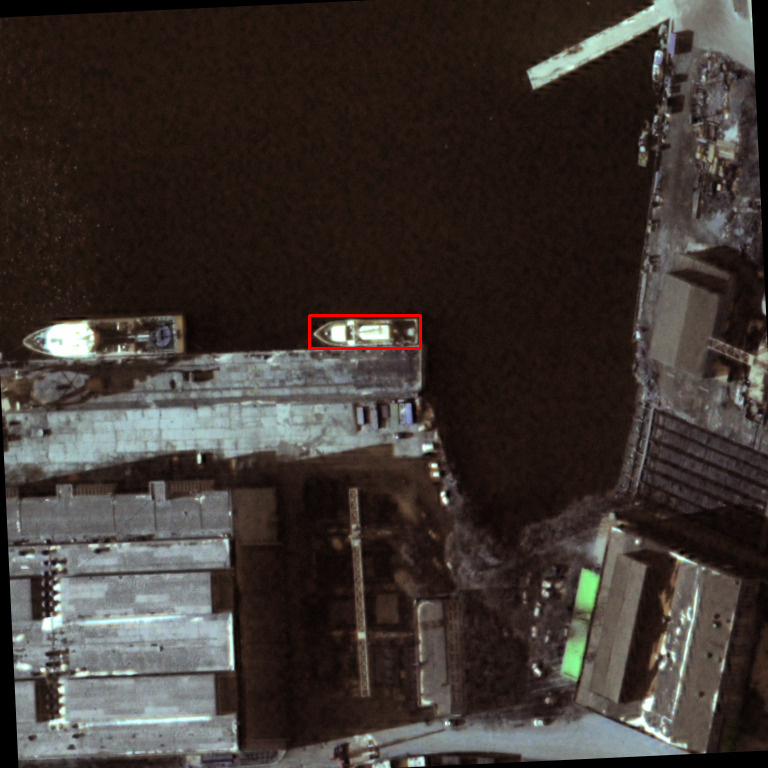

b'100.png' (768, 768, 3)
smallest:  []
biggest:  []
smallest:  []
biggest:  []
x_diff, y_diff 0 0
rbbox:  [[578.4160992454904, 422.6474592562546], [749.434302980842, 422.6474592562546], [749.434302980842, 467.0743582125535], [578.4160992454904, 467.0743582125535]]
rimage shape:  (768, 768, 3)
rbbox:  [[578.4160992454904, 422.6474592562546], [749.434302980842, 422.6474592562546], [749.434302980842, 467.0743582125535], [578.4160992454904, 467.0743582125535]]
rimage shape:  (768, 768, 3)
(578, 422) (749, 467)


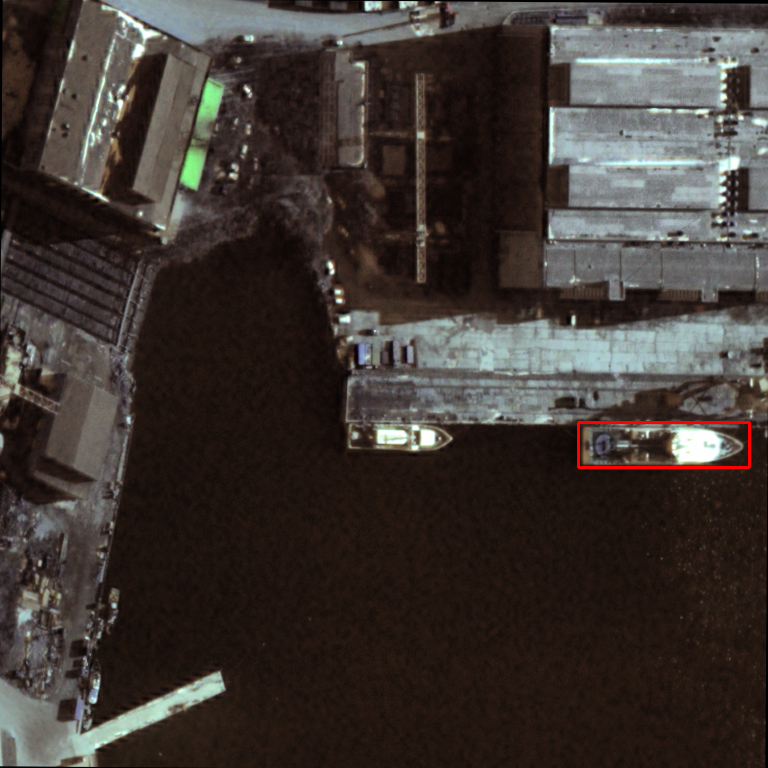

b'100.png' (768, 768, 3)
smallest:  []
biggest:  []
smallest:  []
biggest:  []
x_diff, y_diff 0 0
rbbox:  [[66.42893426792985, 419.0221457194597], [237.44713800328137, 419.0221457194597], [237.44713800328142, 463.4490446757585], [66.42893426792985, 463.44904467575856]]
rimage shape:  (768, 768, 3)
rbbox:  [[66.42893426792985, 419.0221457194597], [237.44713800328137, 419.0221457194597], [237.44713800328142, 463.4490446757585], [66.42893426792985, 463.44904467575856]]
rimage shape:  (768, 768, 3)
(66, 419) (237, 463)


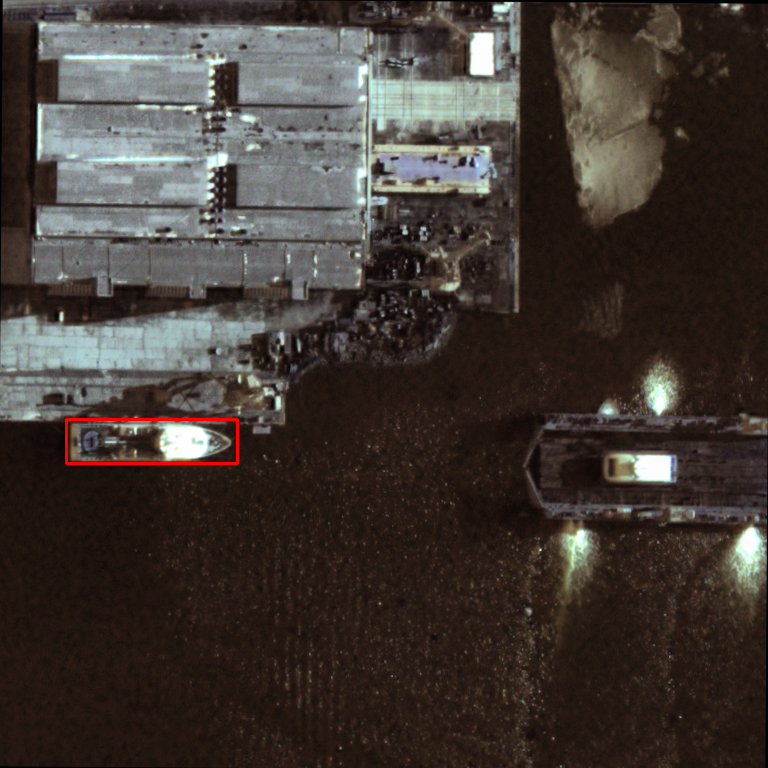

b'100.png' (768, 768, 3)
smallest:  []
biggest:  []
smallest:  []
biggest:  []
x_diff, y_diff 0 0
rbbox:  [[339.48471998096943, 178.75837015508353], [448.78805707813734, 178.7583701550834], [448.78805707813734, 212.45016931890177], [339.4847199809694, 212.45016931890189]]
rimage shape:  (768, 768, 3)
rbbox:  [[339.48471998096943, 178.75837015508353], [448.78805707813734, 178.7583701550834], [448.78805707813734, 212.45016931890177], [339.4847199809694, 212.45016931890189]]
rimage shape:  (768, 768, 3)
(339, 178) (448, 212)


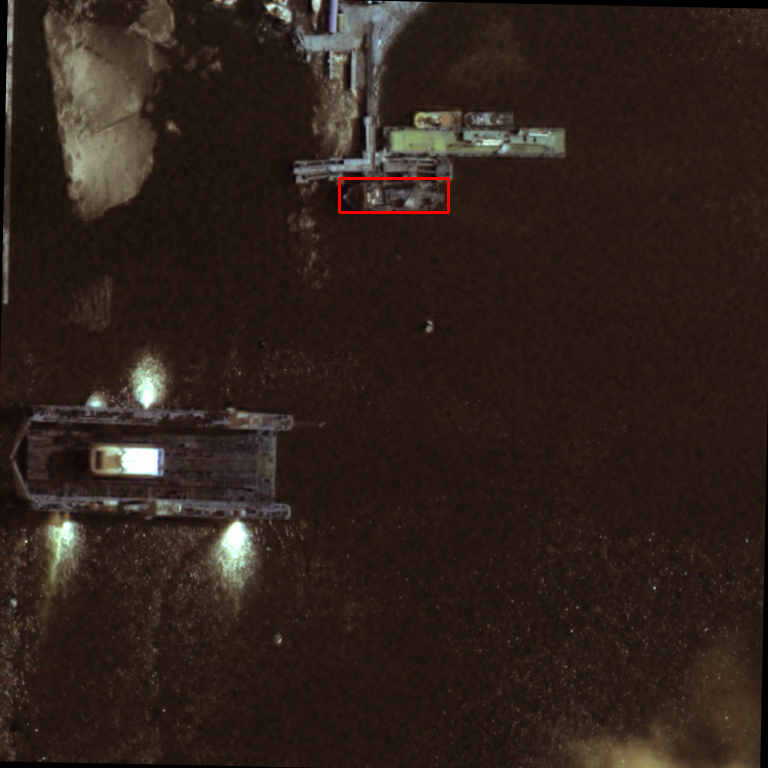

b'100.png' (768, 768, 3)
smallest:  []
biggest:  []
smallest:  []
biggest:  []
x_diff, y_diff 0 0
rbbox:  [[328.9663783597099, 690.6503162624026], [438.2697154568778, 690.6503162624026], [438.26971545687786, 724.342115426221], [328.9663783597099, 724.342115426221]]
rimage shape:  (768, 768, 3)
rbbox:  [[328.9663783597099, 690.6503162624026], [438.2697154568778, 690.6503162624026], [438.26971545687786, 724.342115426221], [328.9663783597099, 724.342115426221]]
rimage shape:  (768, 768, 3)
(328, 690) (438, 724)


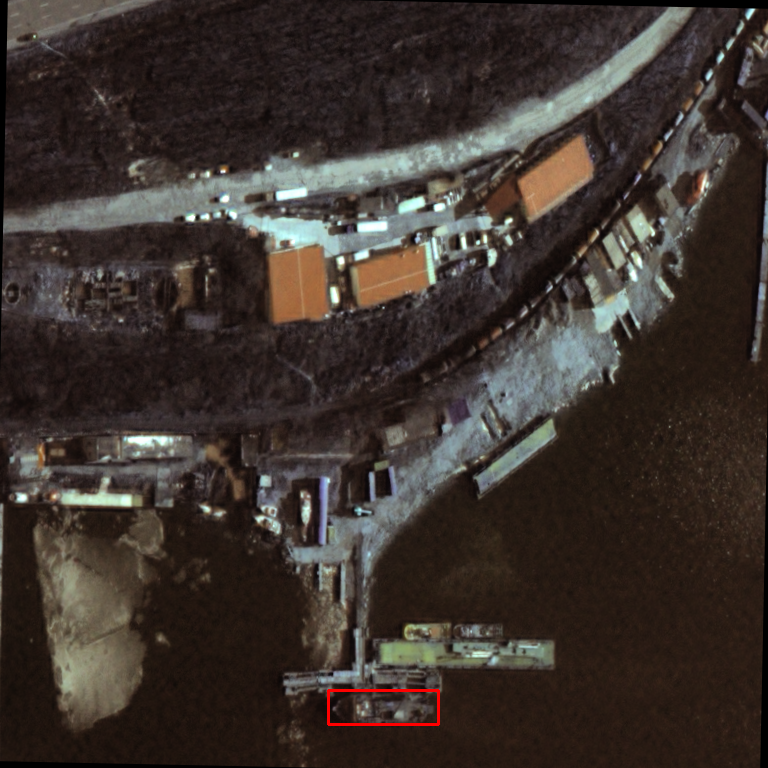

b'101.png' (768, 768, 3)
smallest:  []
biggest:  []
smallest:  []
biggest:  []
x_diff, y_diff 0 0
rbbox:  [[261.6453775111793, 104.54479682014642], [637.9066690150855, 104.54479682014636], [637.9066690150855, 180.56088721321265], [261.6453775111792, 180.56088721321277]]
rimage shape:  (768, 768, 3)
rbbox:  [[261.6453775111793, 104.54479682014642], [637.9066690150855, 104.54479682014636], [637.9066690150855, 180.56088721321265], [261.6453775111792, 180.56088721321277]]
rimage shape:  (768, 768, 3)
(261, 104) (637, 180)


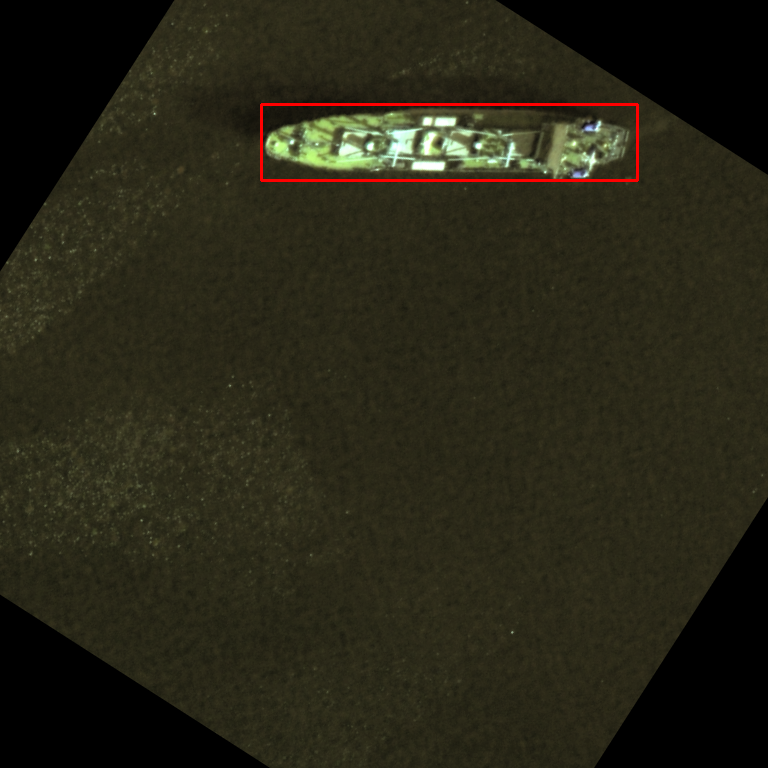

b'101.png' (768, 768, 3)
smallest:  [-14.96978355 -14.96978355]
biggest:  []
smallest:  []
biggest:  []
x_diff, y_diff 24.96978354890527 0
rbbox:  [[10.000000000000028, 535.3905379754971], [386.26129150390625, 535.3905379754971], [386.26129150390625, 611.4066283685635], [10.0, 611.4066283685635]]
rimage shape:  (768, 768, 3)
rbbox:  [[10.000000000000028, 535.3905379754971], [386.26129150390625, 535.3905379754971], [386.26129150390625, 611.4066283685635], [10.0, 611.4066283685635]]
rimage shape:  (768, 768, 3)
(10, 535) (386, 611)


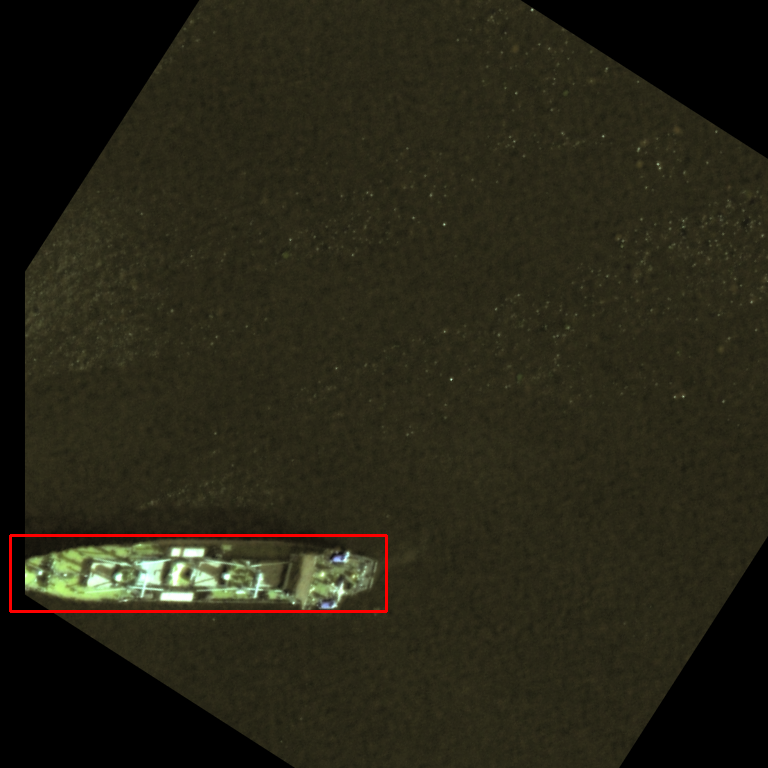

b'1013.png' (768, 768, 3)
smallest:  []
biggest:  [827.04959269 827.04959269]
smallest:  []
biggest:  []
x_diff, y_diff -69.04959268523112 0
rbbox:  [[-63.47363281249993, 479.4876538206865], [758.0, 479.4876538206865], [757.9999999999999, 650.5902234007648], [-63.47363281249993, 650.5902234007647]]
rimage shape:  (768, 768, 3)
rbbox:  [[-63.47363281249993, 479.4876538206865], [758.0, 479.4876538206865], [757.9999999999999, 650.5902234007648], [-63.47363281249993, 650.5902234007647]]
rimage shape:  (768, 768, 3)
(-63, 479) (757, 650)


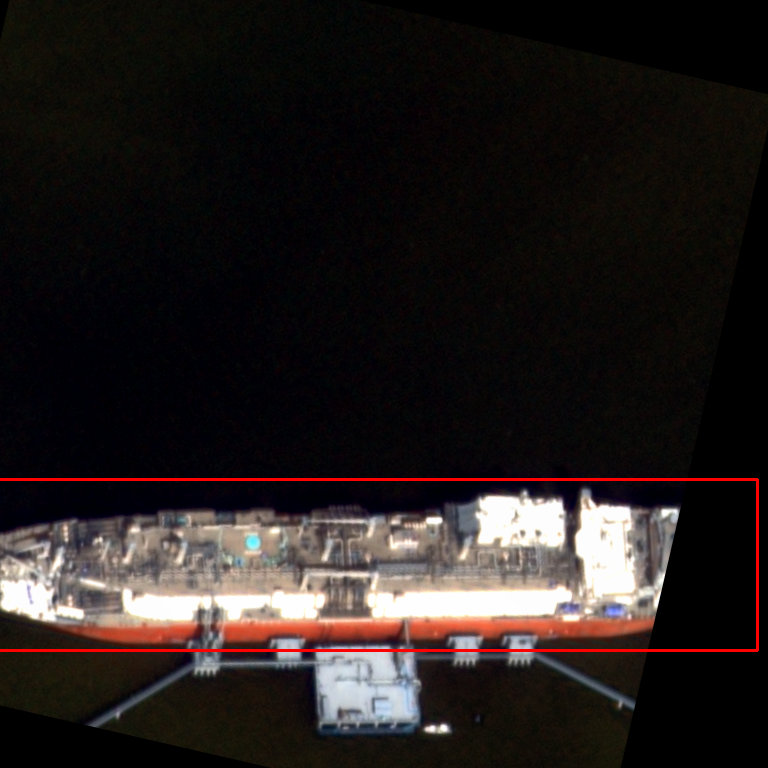

b'1022.png' (768, 768, 3)
smallest:  []
biggest:  [827.78560621 827.78560621]
smallest:  []
biggest:  []
x_diff, y_diff -69.7856062095376 0
rbbox:  [[471.16403198242176, 465.87191530674266], [757.9999999999999, 465.8719153067426], [758.0, 501.82504412143993], [471.1640319824219, 501.82504412143993]]
rimage shape:  (768, 768, 3)
rbbox:  [[471.16403198242176, 465.87191530674266], [757.9999999999999, 465.8719153067426], [758.0, 501.82504412143993], [471.1640319824219, 501.82504412143993]]
rimage shape:  (768, 768, 3)
(471, 465) (758, 501)


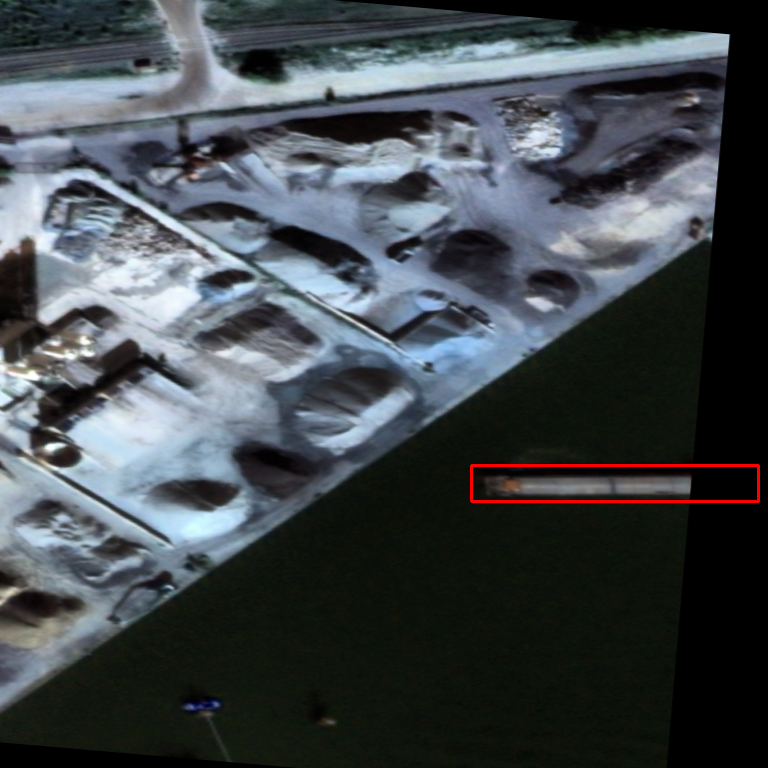

b'1022.png' (768, 768, 3)
smallest:  []
biggest:  []
smallest:  []
biggest:  []
x_diff, y_diff 0 0
rbbox:  [[30.84362595586225, 421.8735485122041], [317.67959397344043, 421.873548512204], [317.6795939734404, 457.82667732690135], [30.843625955862258, 457.8266773269013]]
rimage shape:  (768, 768, 3)
rbbox:  [[30.84362595586225, 421.8735485122041], [317.67959397344043, 421.873548512204], [317.6795939734404, 457.82667732690135], [30.843625955862258, 457.8266773269013]]
rimage shape:  (768, 768, 3)
(30, 421) (317, 457)


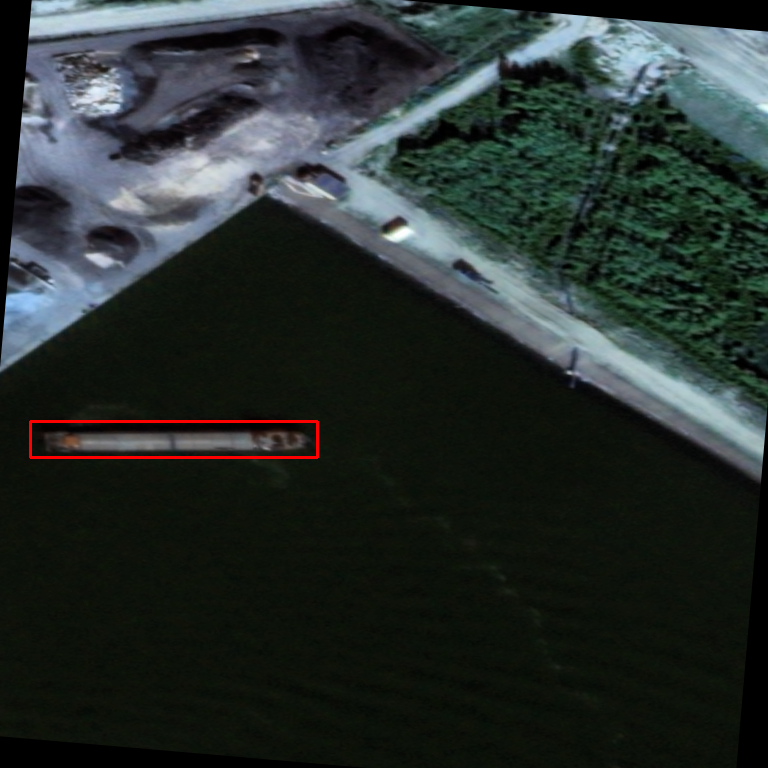

b'1022.png' (768, 768, 3)
smallest:  []
biggest:  []
smallest:  []
biggest:  []
x_diff, y_diff 0 0
rbbox:  [[390.3209930153927, 316.51837103044136], [510.3528533669551, 316.5183710304413], [510.35285336695523, 357.18138448869337], [390.3209930153926, 357.1813844886933]]
rimage shape:  (768, 768, 3)
rbbox:  [[390.3209930153927, 316.51837103044136], [510.3528533669551, 316.5183710304413], [510.35285336695523, 357.18138448869337], [390.3209930153926, 357.1813844886933]]
rimage shape:  (768, 768, 3)
(390, 316) (510, 357)


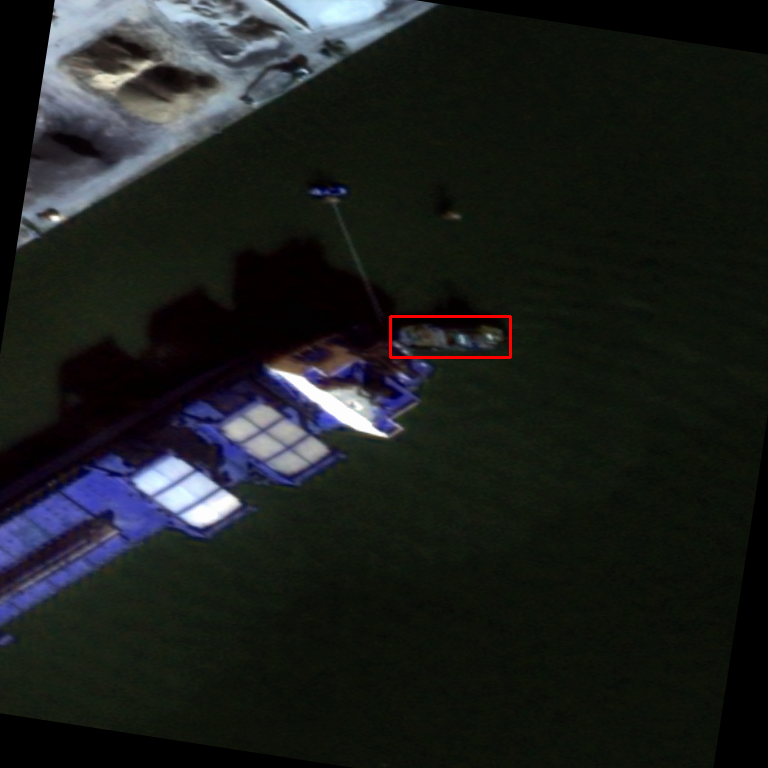

b'1022.png' (768, 768, 3)
smallest:  [-265.03541058 -265.03541058]
biggest:  []
smallest:  []
biggest:  []
x_diff, y_diff 275.035410579221 0
rbbox:  [[10.0, 277.57069533731016], [718.5387573242188, 277.5706953373101], [718.5387573242188, 451.9484571781304], [10.0, 451.9484571781304]]
rimage shape:  (768, 768, 3)
rbbox:  [[10.0, 277.57069533731016], [718.5387573242188, 277.5706953373101], [718.5387573242188, 451.9484571781304], [10.0, 451.9484571781304]]
rimage shape:  (768, 768, 3)
(10, 277) (718, 451)


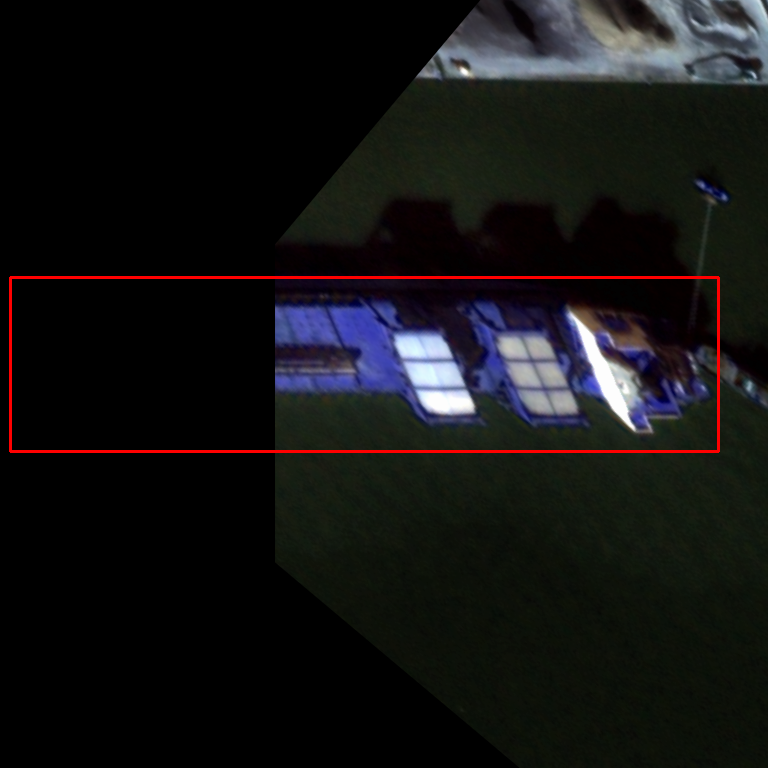

In [26]:
from pprint import pprint
import pandas as pd

i=0
try:
    while True:
        if 10 == i: break
        image_features = sess.run(next_element)

        cxv = image_features['image/object/rbbox/cx'].values
        cyv = image_features['image/object/rbbox/cy'].values
        hv = image_features['image/object/rbbox/h'].values
        wv = image_features['image/object/rbbox/w'].values
        angv = image_features['image/object/rbbox/ang'].values
        labels = image_features['image/object/class/label'].values
        encoded_jpg_io = io.BytesIO(image_features['image/encoded'])

        oimage = np.array(Image.open(encoded_jpg_io))
        
        for cx, cy, h, w, theta, label in zip(cxv, cyv, hv, wv, angv, labels):
            image = oimage.copy()
            print(image_features['image/filename'], image.shape) 

            x1, y1, x3, y3 = cx-(w/2), cy-(h/2), cx+(w/2), cy+(h/2)
            x4, y4, x2, y2 = cx-(w/2), cy+(h/2), cx+(w/2), cy-(h/2)
            bbox = [(x1, y1), (x2, y2), (x3, y3), (x4, y4)]

            theta= math.degrees(theta)

            #image = rotate_bound(image, theta)            
            bbox = rotate_init_box(bbox, cx, cy, -theta)
            #print(cx, cy, h, w, ang)
            #print("bbox: ", bbox)
            
            rimage = rotate_bound(image, theta)       

            pline = np.array(bbox, dtype=np.int32)            

            (heigth, width) = image.shape[:2]
            (cX, cY) = (width // 2, heigth // 2)
            rbbox = rotate_box(bbox, cX, cY, heigth, width, theta)

            #print("rbbox: ", rbbox)
            # 이미지 회전 후 bbox가 이미지 사이즈보다 더 커지는 경우 방지
            # bbox가 이미지 사이즈 보다 크거나 작을 경우 사이즈를 옮긴다
            xs = [box[0] for box in rbbox]
            ys = [box[1] for box in rbbox]
            
            x_diff = diff_baseline_image(xs, image.shape[0])
            y_diff = diff_baseline_image(ys, image.shape[1])

            print("x_diff, y_diff", x_diff, y_diff)
            rows, cols = image.shape[:2]

            # 변환 행렬, X축으로 10, Y축으로 20 이동
            M = np.float32([[1,0,x_diff],[0,1,y_diff]])

            rimage = cv2.warpAffine(rimage, M,(cols, rows))

            rbbox = [[x+x_diff, y+y_diff] for x, y in zip(xs, ys)]
            print("rbbox: ", rbbox)
            print("rimage shape: ", rimage.shape)

            xy = pd.DataFrame(data=rbbox, columns=['x','y'])
            xy1 = xy.nsmallest(2, 'x').nsmallest(1, 'y').values[0].tolist()    
            xy2 = xy.nlargest(2, 'y').nlargest(1, 'x').values[0].tolist()  

            mn = [int(x) for x in xy1]
            mx = [int(x) for x in xy2]

            print("rbbox: ", rbbox)
            print("rimage shape: ", rimage.shape)
            print((mn[0], mn[1]), (mx[0], mx[1]))
            pline = np.array(rbbox, dtype=np.int32)
            cv2.rectangle(rimage, (mn[0], mn[1]), (mx[0], mx[1]), (0, 0, 255), 2 )
            cv2_imshow(rimage)
        i+=1
except tf.errors.OutOfRangeError:
    pass





In [0]:
from pprint import pprint

i=0
try:
    while True:
        if 10 == i: break
        image_features = sess.run(next_element)

        cxv = image_features['image/object/rbbox/cx'].values
        cyv = image_features['image/object/rbbox/cy'].values
        hv = image_features['image/object/rbbox/h'].values
        wv = image_features['image/object/rbbox/w'].values
        angv = image_features['image/object/rbbox/ang'].values
        labels = image_features['image/object/class/label'].values
        encoded_jpg_io = io.BytesIO(image_features['image/encoded'])

        oimage = np.array(Image.open(encoded_jpg_io))
        
        for cx, cy, h, w, theta, label in zip(cxv, cyv, hv, wv, angv, labels):
            image = oimage.copy()
            print(image_features['image/filename'], image.shape) 

            x1, y1, x3, y3 = cx-(w/2), cy-(h/2), cx+(w/2), cy+(h/2)
            x4, y4, x2, y2 = cx-(w/2), cy+(h/2), cx+(w/2), cy-(h/2)
            bbox = [(x1, y1), (x2, y2), (x3, y3), (x4, y4)]

            theta= math.degrees(theta)

            #image = rotate_bound(image, theta)            
            bbox = rotate_init_box(bbox, cx, cy, -theta)
            #print(cx, cy, h, w, ang)
            #print("bbox: ", bbox)
            
            rimage = rotate_bound(image, theta)       

            pline = np.array(bbox, dtype=np.int32)            
            cv2.polylines(image, [pline], True, (0, 0, 255), 2)  
            cv2_imshow(image)

            (heigth, width) = image.shape[:2]
            (cX, cY) = (width // 2, heigth // 2)
            rbbox = rotate_box(bbox, cX, cY, heigth, width, theta)



            #print("rbbox: ", rbbox)
            # 이미지 회전 후 bbox가 이미지 사이즈보다 더 커지는 경우 방지
            # bbox가 이미지 사이즈 보다 크거나 작을 경우 사이즈를 옮긴다
            xs = [box[0] for box in rbbox]
            ys = [box[1] for box in rbbox]
            
            x_diff = diff_baseline_image(xs, image.shape[0])
            y_diff = diff_baseline_image(ys, image.shape[1])

            print("x_diff, y_diff", x_diff, y_diff)
            rows, cols = image.shape[:2]

            # 변환 행렬, X축으로 10, Y축으로 20 이동
            M = np.float32([[1,0,x_diff],[0,1,y_diff]])

            rimage = cv2.warpAffine(rimage, M,(cols, rows))

            rbbox = [[x+x_diff, y+y_diff] for x, y in zip(xs, ys)]
            print("rbbox: ", rbbox)
            print("rimage shape: ", rimage.shape)
            pline = np.array(rbbox, dtype=np.int32)
            cv2.polylines(rimage, [pline], True, (0, 0, 255), 2)  
            cv2_imshow(rimage)
        i+=1
except tf.errors.OutOfRangeError:
    pass





In [0]:
import io
import numpy as np
import cv2
import tensorflow as tf
from PIL import Image
from google.colab.patches import cv2_imshow
import math

# feature를 묘사하는 dictionary를 생성합니다.
image_feature_description = {
    'image/encoded': tf.FixedLenFeature((), tf.string, default_value=''),
    'image/format': tf.FixedLenFeature((), tf.string, default_value='png'),
    'image/filename': tf.FixedLenFeature((), tf.string, default_value=''),
    'image/height': tf.FixedLenFeature((), tf.int64, 1),
    'image/width': tf.FixedLenFeature((), tf.int64, 1),
                
    # Object rotated boxes.
    'image/object/rbbox/cy': tf.VarLenFeature(tf.float32),
    'image/object/rbbox/cx': tf.VarLenFeature(tf.float32),
    'image/object/rbbox/h': tf.VarLenFeature(tf.float32),
    'image/object/rbbox/w': tf.VarLenFeature(tf.float32),
    'image/object/rbbox/ang': tf.VarLenFeature(tf.float32),

    # Object classes.
    'image/object/class/label': tf.VarLenFeature(tf.int64),
    #'image/object/class/text': tf.FixedLenFeature((), tf.string, default_value=''),
}


class TfrecordsGenerator(Generator):
    """
    Generate data for a custom CSV dataset.
    See https://github.com/fizyr/keras-retinanet#csv-datasets for more information.
    """

    def __init__(
            self,
            tfrecords_file,
            base_dir=None,
            **kwargs
    ):

        self.rbboxs = []
        self.images = []
        self.classes = {'a': 0, 'b': 1, 'c': 2, 'd': 3}

        self.labels = {}
        # class_id --> class_name
        for key, value in self.classes.items():
            self.labels[value] = key

        
        #tfrecords_file = "/content/gdrive/My Drive/findShip/tfrecords/test_40p_w_neg_img_only_pos.tfrecords"
        
        next_element = self.read_tfrecords(tfrecords_file)
        self.rbboxs, self.images = self.parse_tfrecords(next_element)

        self.image_names = []
        self.image_data = {}

        super(TfrecordsGenerator, self).__init__(**kwargs)

    def read_tfrecords(self, tfrecords_file):
        def _parse_image_function(example_proto):
            # tf.Example을 parsing합니다.
            return tf.parse_single_example(example_proto, image_feature_description)        
        
        # tf.data.TFRecordDataset을 생성합니다.
        raw_image_dataset = tf.data.TFRecordDataset(tfrecords_file)
        parsed_image_dataset = raw_image_dataset.map(_parse_image_function)
        print(parsed_image_dataset)

        # tf.data.TFRecordDataset을 iterator로 돌면서 이미지를 화면에 출력합니다.
        iterator = parsed_image_dataset.make_one_shot_iterator()
        next_element = iterator.get_next()
        return next_element
        
    def parse_tfrecords(self, next_element):
        labels = []
        images = []
        image_idx=0

        # InteractiveSession을 엽니다.
        sess = tf.InteractiveSession()

        try:
            while True:
                if 10 == image_idx: break
                image_features = sess.run(next_element)

                cxv = image_features['image/object/rbbox/cx'].values
                cyv = image_features['image/object/rbbox/cy'].values
                hv = image_features['image/object/rbbox/h'].values
                wv = image_features['image/object/rbbox/w'].values
                thetav = image_features['image/object/rbbox/ang'].values
                answers = image_features['image/object/class/label'].values
                encoded_jpg_io = io.BytesIO(image_features['image/encoded'])

                try:
                    images[image_idx]
                except IndexError:
                    images.append(encoded_jpg_io)
                
                oimage = np.array(Image.open(encoded_jpg_io))
                for cx, cy, h, w, theta, answer in zip(cxv, cyv, hv, wv, thetav, answers):
                    image = oimage.copy()
                    (heigth, width) = image.shape[:2]
                    (imgcX, imgcY) = (width // 2, heigth // 2)
                    theta= math.degrees(theta)

                    #print(image_features['image/filename'], image.shape) 
                    rbox = self.convert_bbox_to_rbox(cx, cy, h, w, theta)

                    rbbox = self.rotate_box(rbox, imgcX, imgcY, heigth, width, theta)
                    image = self.rotate_bound(image, theta)

                    # 이미지 회전 후 bbox가 이미지 사이즈보다 더 커지는 경우 방지
                    # bbox가 이미지 사이즈 보다 크거나 작을 경우 사이즈를 옮긴다
                    xs = [box[0] for box in rbbox]
                    ys = [box[1] for box in rbbox]

                    x_diff = self.diff_baseline_image(xs, image.shape[0])
                    y_diff = self.diff_baseline_image(ys, image.shape[1])

                    rbbox = [[x+x_diff, y+y_diff] for x, y in zip(xs, ys)]

                    xy = pd.DataFrame(data=rbbox, columns=['x','y'])
                    xy1 = xy.nsmallest(2, 'x').nsmallest(1, 'y').values[0].tolist()    
                    xy2 = xy.nlargest(2, 'y').nlargest(1, 'x').values[0].tolist()  

                    #print("rbbox: ", rbbox)
                    #print("rimage shape: ", image.shape)
                    #print("xy, xy", xy1, xy2)
                    labels.append(
                        {"image_param": {'x_diff': x_diff, 'y_diff': y_diff,
                                    'theta': theta, 'fileidx': image_idx},
                        "rbbox": {'minX': xy1[0], 'minY': xy1[1],
                                'maxX': xy2[0], 'maxY': xy2[1],
                                'label': answer}
                        })
                image_idx+=1
        except tf.errors.OutOfRangeError:
            pass

        return labels, images

    def convert_bbox_to_rbox(self, cx, cy, h, w, theta):
        def rotate_init_box(bb, cx, cy, theta):
            new_bb = list(bb)
            for i,coord in enumerate(bb):
                # opencv calculates standard transformation matrix
                M = cv2.getRotationMatrix2D((cx, cy), theta, 1.0)
                # Grab  the rotation components of the matrix)
                # Prepare the vector to be transformed
                v = [coord[0],coord[1],1]
                # Perform the actual rotation and return the image
                calculated = np.dot(M,v)
                new_bb[i] = (calculated[0],calculated[1])
            return new_bb
        x1, y1, x3, y3 = cx-(w/2), cy-(h/2), cx+(w/2), cy+(h/2)
        x4, y4, x2, y2 = cx-(w/2), cy+(h/2), cx+(w/2), cy-(h/2)
        bbox = [(x1, y1), (x2, y2), (x3, y3), (x4, y4)]
    
        rbox = rotate_init_box(bbox, cx, cy, -theta)
        return rbox

    def rotate_box(self, bb, cx, cy, h, w, theta):
        new_bb = list(bb)
        for i,coord in enumerate(bb):
            # opencv calculates standard transformation matrix
            M = cv2.getRotationMatrix2D((cx, cy), theta, 1.0)
            # Prepare the vector to be transformed
            v = [coord[0],coord[1],1]
            # Perform the actual rotation and return the image
            calculated = np.dot(M,v)
            new_bb[i] = (calculated[0],calculated[1])
        return new_bb

    def rotate_bound(self, image, angle):
        # grab the dimensions of the image and then determine the
        # centre
        (h, w) = image.shape[:2]
        (cX, cY) = (w // 2, h // 2)

        # grab the rotation matrix (applying the negative of the
        # angle to rotate clockwise), then grab the sine and cosine
        # (i.e., the rotation components of the matrix)
        M = cv2.getRotationMatrix2D((cX, cY), angle, 1.0)
        cos = np.abs(M[0, 0])
        sin = np.abs(M[0, 1])

        # compute the new bounding dimensions of the image
        nW = int((h * sin) + (w * cos))
        nH = int((h * cos) + (w * sin))

        # adjust the rotation matrix to take into account translation
        #M[0, 2] += (nW / 2) - cX
        #M[1, 2] += (nH / 2) - cY

        # perform the actual rotation and return the image
        return cv2.warpAffine(image, M, (nW, nH))

    def diff_baseline_image(self, points, base):
        points = np.array(points)
        padding = 10
        print("smallest: ", points[points < 0])
        print("biggest: ", points[base < points])

        if (not len(points[base < points]) == 0) and (not len(points[points < 0]) == 0):
            print("What??? small image")
            return 0
        diff=0
        over = points[base < points]
        if not 0 == len(over):
            diff = max(over) - base + padding

        over = points[points < 0]
        if not 0 == len(over):
            diff = min(over) - padding
        return -diff      

    def size(self):
        """
        Size of the dataset.
        """
        return len(self.rbboxs)

    def num_classes(self):
        """
        Number of classes in the dataset.
        """
        #print("num_class is %s" % str( max(self.classes.values()) + 1) )
        return len(self.classes)

    def has_label(self, label):
        """
        Return True if label is a known label.
        """
        return label in self.labels

    def has_name(self, name):
        """
        Returns True if name is a known class.
        """
        return name in self.classes

    def name_to_label(self, name):
        """
        Map name to label.
        """
        return self.classes[name]

    def label_to_name(self, label):
        """
        Map label to name.
        """
        return self.labels[label]

    """
    def image_path(self, image_index):
        """
        Returns the image path for image_index.
        """
        return os.path.join(self.base_dir, self.image_names[image_index])
    """

    def image_aspect_ratio(self, image_index):
        """
        Compute the aspect ratio for an image with image_index.
        """
        # PIL is fast for metadata
        #image = Image.open(self.image_path(image_index))
        #return float(image.width) / float(image.height)
        # 모든 이미지의 비율이 고정임
        return float(768) / float(768)

    def load_image(self, index):
        """
        Load an image at the image_index.
        """
        x_diff, y_diff = self.rbboxs[index]['image_param']['x_diff'], self.rbboxs[index]['image_param']['y_diff']
        theta, fileidx = self.rbboxs[index]['image_param']['theta'], self.rbboxs[index]['image_param']['fileidx']
        image = np.array(Image.open(self.images[fileidx]))
        # 이미지 돌리기
        image = self.rotate_bound(image, theta)
        # 이미지 이동
        (heigth, width) = 768, 768 #image.shape[:2]
        print(heigth, width)
        M = np.float32([[1,0,x_diff],[0,1,y_diff]])
        image = cv2.warpAffine(image, M, (width, heigth))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return image

    def load_annotations(self, image_index):
        """
        Load annotations for an image_index.
        """
        annotations = {'labels': np.empty((0,), dtype=np.int32), 'bboxes': np.empty((0, 4))}

        for idx, annot in enumerate(self.rbboxs):
            annotations['labels'] = np.concatenate((annotations['labels'], [annot['rbbox']['label']]))
            annotations['bboxes'] = np.concatenate((annotations['bboxes'], [[
                float(annot['rbbox']['minX']),
                float(annot['rbbox']['minY']),
                float(annot['rbbox']['maxX']),
                float(annot['rbbox']['maxY']),
            ]]))

        return annotations
